In this file I Investigate and perform EDA on the winequality_2.csv file. Below I have summarised my findings: 

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

In [2]:
wine = pd.read_csv('winequality_2.csv')


In [3]:
wine.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5,1
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5,1
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6,1
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5,1


In [4]:
wine.shape

(6497, 13)

In [5]:
wine.dtypes

fixed acidity           float64
volatile acidity        float64
citric acid             float64
residual sugar          float64
chlorides               float64
free sulfur dioxide     float64
total sulfur dioxide    float64
density                 float64
pH                      float64
sulphates               float64
alcohol                 float64
quality                   int64
red_wine                  int64
dtype: object

In [6]:
wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               1
free sulfur dioxide     0
total sulfur dioxide    0
density                 1
pH                      0
sulphates               0
alcohol                 0
quality                 0
red_wine                0
dtype: int64

# Fixing missing values

I defined the function below which will take a Pandas Series and replace all the NA values with another random non-null value from the same Data Series. The purpose is to replace the NA values but retain the original distribution of data, rather than replacing with the mode which would inevitably skew the data.

Note that all the features of the wine_quality dataset are already numerical rather than categorical, so I will simply replace values with the mean rather than using the function below.

In [7]:
def replace_nan_with_random(series):
    """Replace NaN values in a Pandas Series with random samples from the non-NaN values."""
    # Remove null values
    non_na_series = series.dropna()

    # If the series is empty after removing nulls, return the original series
    if non_na_series.empty:
        return series

    # Use .apply() to replace NaN values with random samples
    return series.apply(lambda x: non_na_series.sample(1).iloc[0] if pd.isna(x) else x)

In [11]:
#Dropping unneeded columns

#All columns look like they could be useful, so I will not drop any values for now. I will reserve judgement until I've looked at the correlation info.

In [8]:
wine["chlorides"].value_counts()

chlorides
0.044    206
0.036    200
0.042    187
0.046    185
0.050    182
        ... 
0.422      1
0.222      1
0.143      1
0.250      1
0.212      1
Name: count, Length: 215, dtype: int64

In [9]:
wine["chlorides"].fillna(wine["chlorides"].mean(), inplace=True)

In [11]:
wine["density"].value_counts()

density
0.99760    69
0.99720    69
0.99800    64
0.99200    64
0.99280    63
           ..
0.99852     1
0.99833     1
0.98853     1
0.99589     1
0.98941     1
Name: count, Length: 998, dtype: int64

In [12]:
wine["density"].fillna(wine["density"].mean(), inplace=True)

In [14]:
wine.isnull().sum()

fixed acidity           0
volatile acidity        0
citric acid             0
residual sugar          0
chlorides               0
free sulfur dioxide     0
total sulfur dioxide    0
density                 0
pH                      0
sulphates               0
alcohol                 0
quality                 0
red_wine                0
dtype: int64

## Checking Outliers

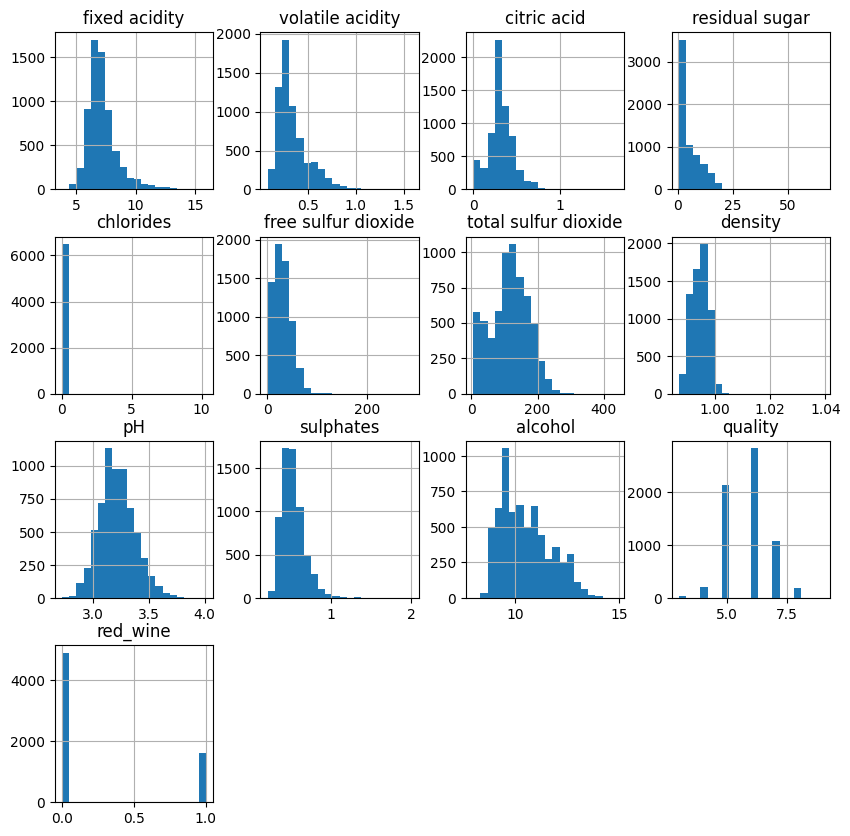

In [41]:
wine.hist(bins=20,figsize=(10,10))
plt.show()

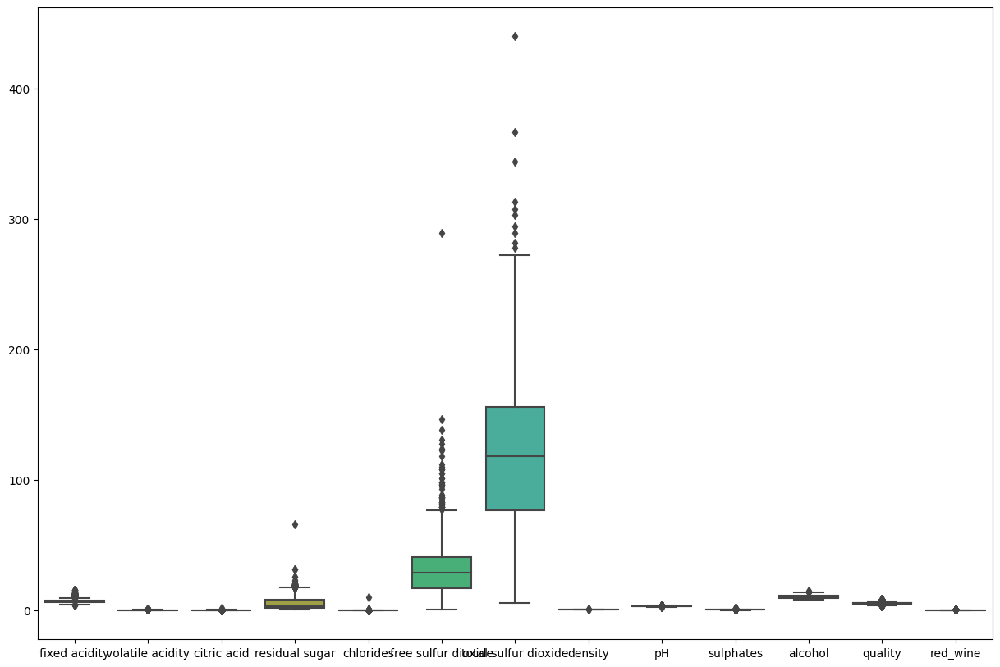

In [15]:
plt.figure(figsize=(15, 10))
sns.boxplot(data=wine)
plt.show()

In [16]:
wine.corr(numeric_only=True)

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality,red_wine
fixed acidity,1.000000,0.219008,0.324436,-0.111981,0.084461,-0.282735,-0.329054,0.458905,-0.252700,0.299568,-0.095452,-0.076743,0.486740
volatile acidity,0.219008,1.000000,-0.377981,-0.196011,0.115973,-0.352557,-0.414476,0.271269,0.261454,0.225984,-0.037640,-0.265699,0.653036
citric acid,0.324436,-0.377981,1.000000,0.142451,-0.000083,0.133126,0.195242,0.096175,-0.329808,0.056197,-0.010493,0.085532,-0.187397
residual sugar,-0.111981,-0.196011,0.142451,1.000000,-0.042611,0.402871,0.495482,0.552694,-0.267320,-0.185927,-0.359415,-0.036980,-0.348821
chlorides,0.084461,0.115973,-0.000083,-0.042611,1.000000,-0.062425,-0.076659,0.102159,0.020197,0.105483,-0.078060,-0.064390,0.156906
free sulfur dioxide,-0.282735,-0.352557,0.133126,0.402871,-0.062425,1.000000,0.720934,0.025796,-0.145854,-0.188457,-0.179838,0.055463,-0.471644
total sulfur dioxide,-0.329054,-0.414476,0.195242,0.495482,-0.076659,0.720934,1.000000,0.032540,-0.238413,-0.275727,-0.265740,-0.041385,-0.700357
density,0.458905,0.271269,0.096175,0.552694,0.102159,0.025796,0.032540,1.000000,0.011350,0.259362,-0.686698,-0.305721,0.390372
pH,-0.252700,0.261454,-0.329808,-0.267320,0.020197,-0.145854,-0.238413,0.011350,1.000000,0.192123,0.121248,0.019506,0.329129
sulphates,0.299568,0.225984,0.056197,-0.185927,0.105483,-0.188457,-0.275727,0.259362,0.192123,1.000000,-0.003029,0.038485,0.487218


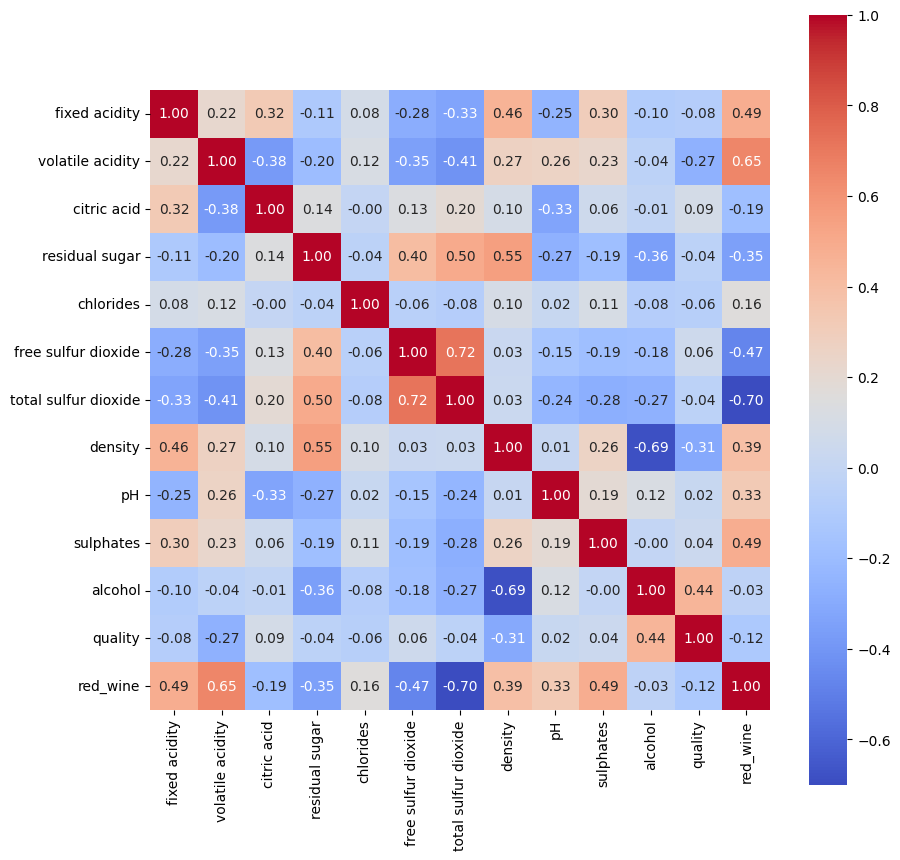

In [17]:
plt.figure(figsize=(10, 10))
sns.heatmap(wine.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.show()

I am now going to split the data frame into two separate datasets for white wine and red wine to see if there are stronger correlations emerging

In [20]:
#Splitting the DF into two seperate DFs
white_wine = wine[wine['red_wine'] == 0]
red_wine = wine[wine['red_wine'] == 1]

White wine first

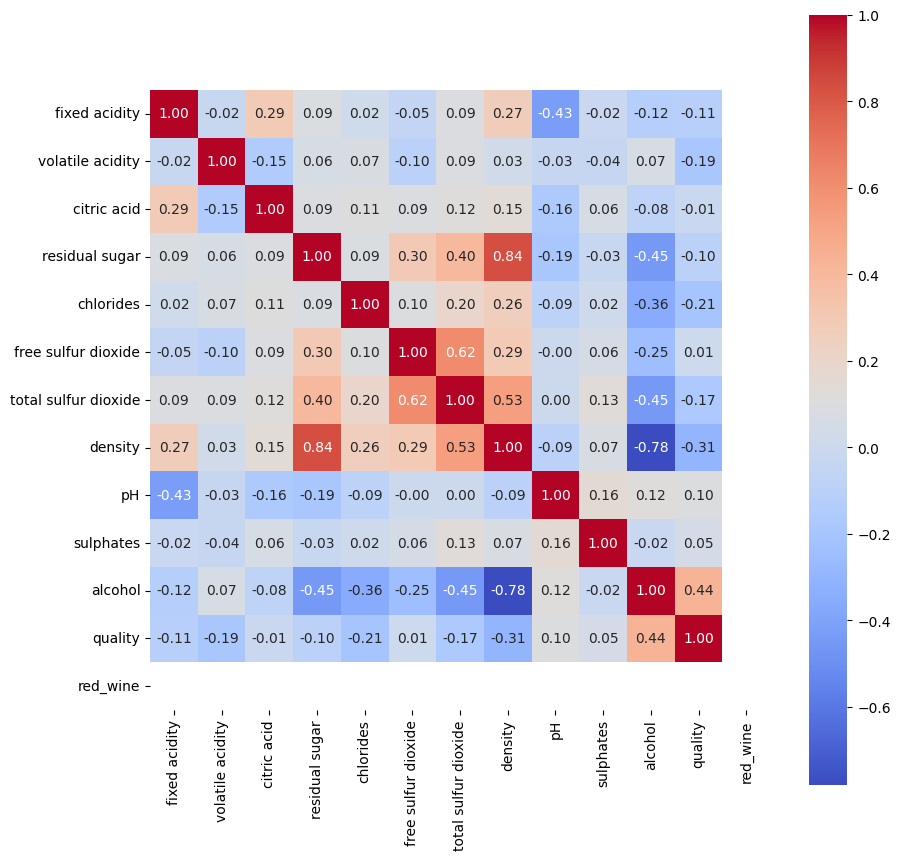

In [22]:
plt.figure(figsize=(10, 10))
sns.heatmap(white_wine.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.show()

Now checking red wine

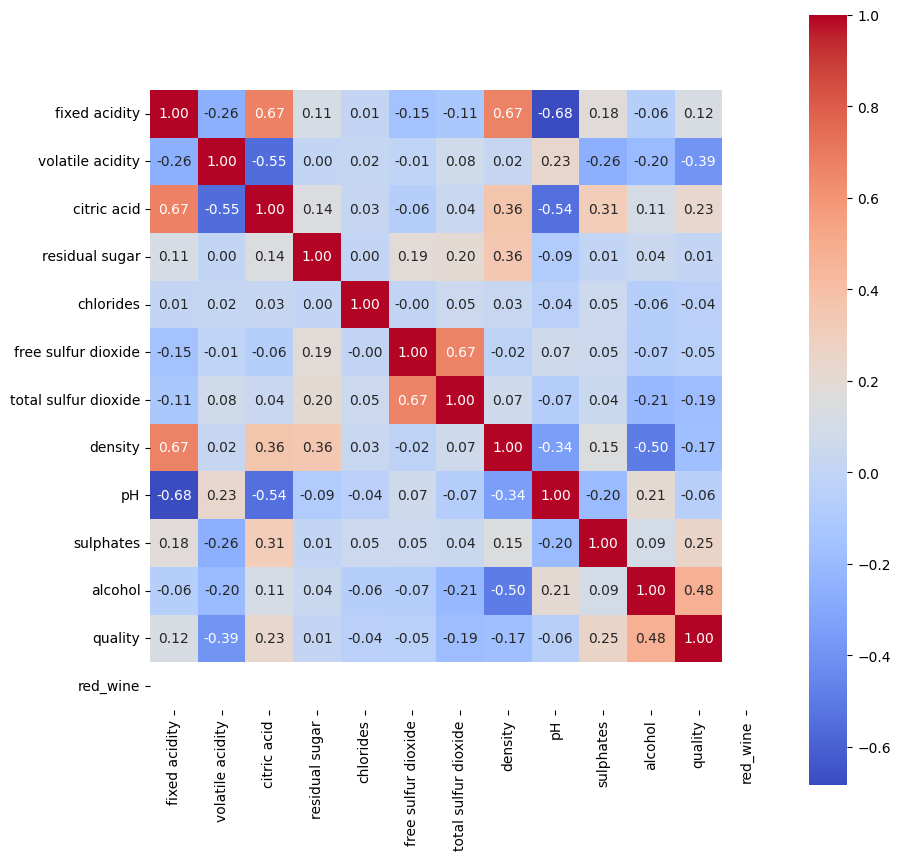

In [23]:
plt.figure(figsize=(10, 10))
sns.heatmap(red_wine.corr(numeric_only=True), annot=True, cmap="coolwarm", fmt=".2f", square=True)
plt.show()

Regarding the quality of the wine - No particularly strong correlations emerged. There is a weak correlation between alcohol and quality.

In [18]:
from ydata_profiling import ProfileReport
#from pydantic_settings import BaseSettings
#from pandas_profiling import ProfileReport

In [19]:
report = ProfileReport(wine, title='Wine Quality Report')
report


Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

c:\Users\Louis\AppData\Local\Programs\Python\Python311\Lib\site-packages\seaborn\axisgrid.py:118: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


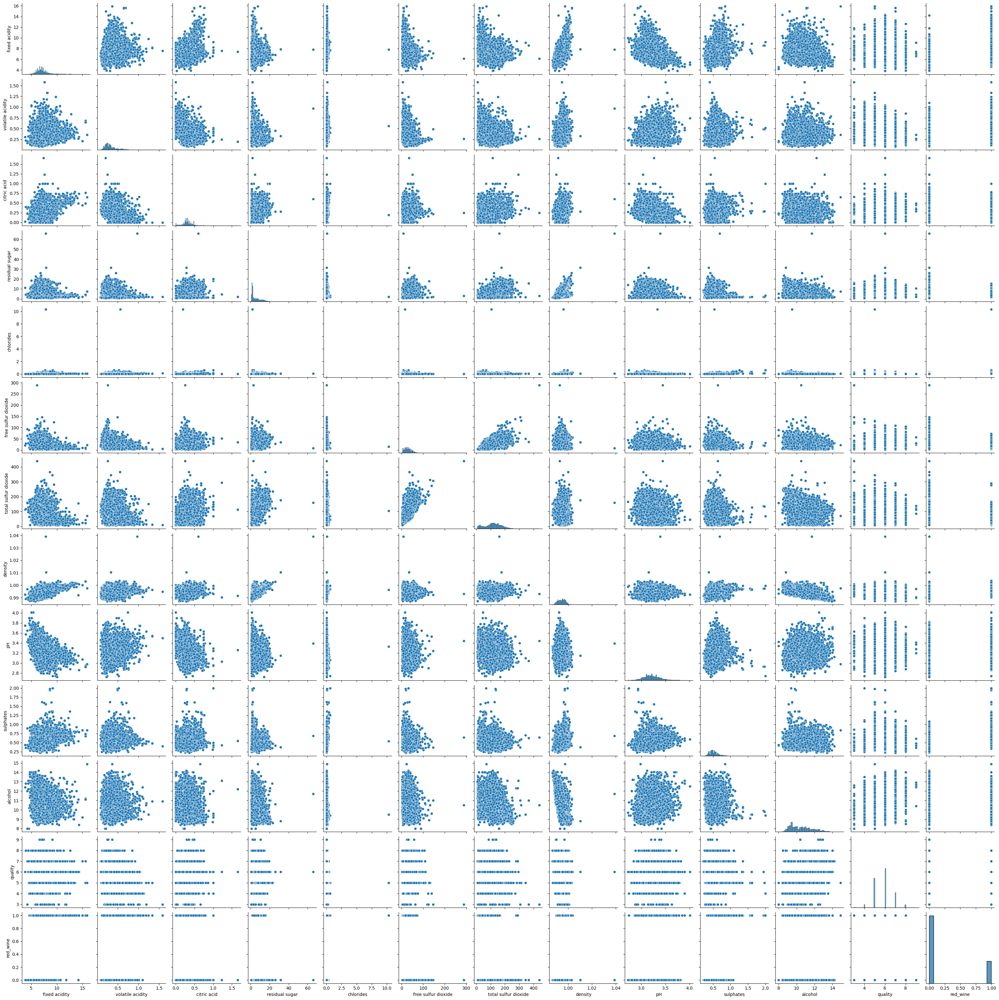

In [24]:
sns.pairplot(wine)

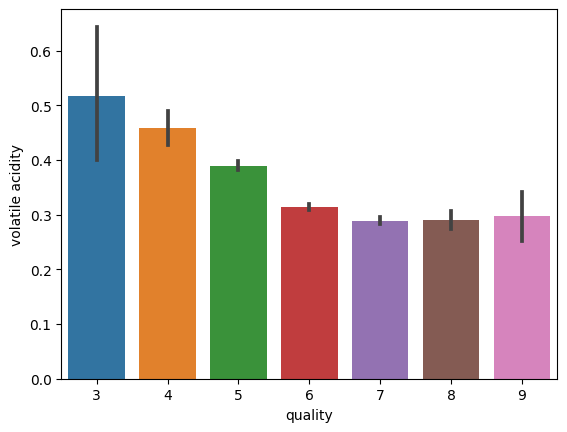

In [37]:
sns.barplot(x='quality', y='volatile acidity', data = wine)
plt.show()

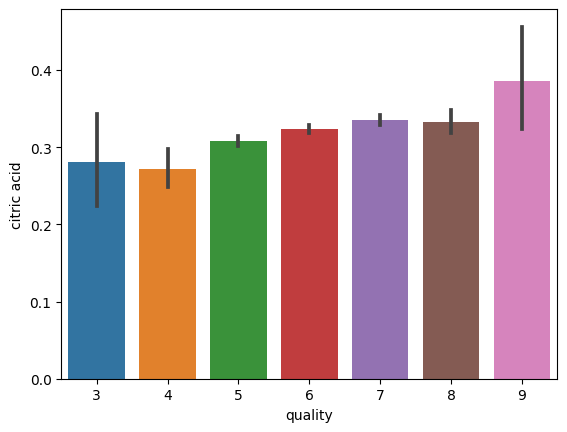

In [38]:
sns.barplot(x='quality', y='citric acid', data = wine)
plt.show()

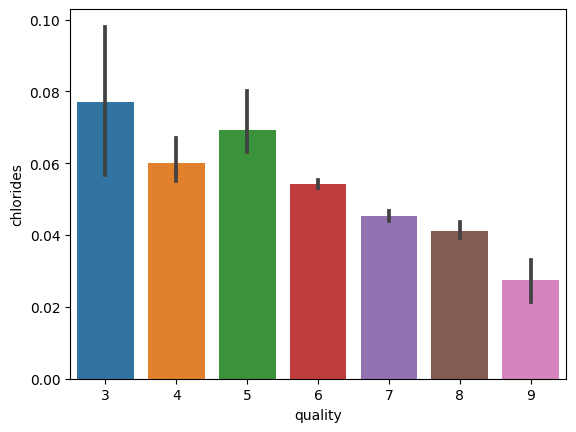

In [40]:
sns.barplot(x='quality', y='chlorides', data = wine)
plt.show()